In [19]:
from PIL import Image
import math
import numpy as np




In [20]:
path = "C:/Users/maksy/Downloads/cv labs"

In [259]:
im = Image.open(f'{path}/1.jpg') # Can be many different formats.

im = im.convert(mode='L')
pix = im.load()

In [260]:
im.size  # Get the width and hight of the image for iterating over


(2992, 2000)

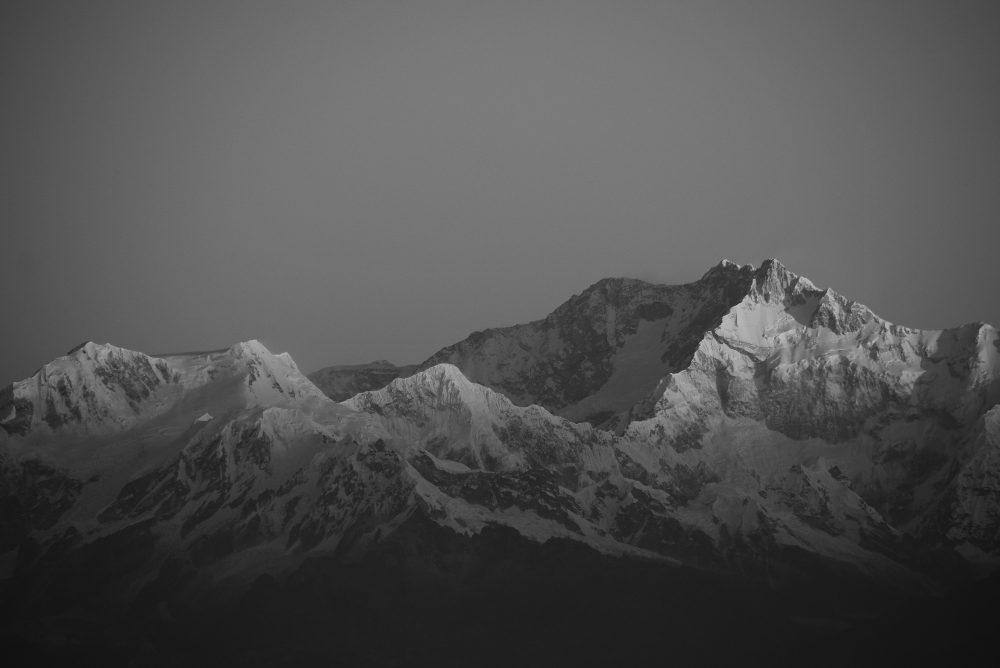

In [261]:
im

In [262]:
width, height = im.size
pixel_values = list(im.getdata())

In [263]:
def Gaussian_Core(size, sigma= 1.4):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    H =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) / (2.0 * np.pi * sigma**2) #formula from lecture
    return H

In [264]:
new = Gaussian_Core(5)

In [265]:
new

array([[0.01054991, 0.02267864, 0.0292689 , 0.02267864, 0.01054991],
       [0.02267864, 0.04875119, 0.06291796, 0.04875119, 0.02267864],
       [0.0292689 , 0.06291796, 0.0812015 , 0.06291796, 0.0292689 ],
       [0.02267864, 0.04875119, 0.06291796, 0.04875119, 0.02267864],
       [0.01054991, 0.02267864, 0.0292689 , 0.02267864, 0.01054991]])

In [266]:
from scipy import signal

In [267]:
new_image = signal.convolve(im, new)

In [268]:
new_image

array([[ 0.68574421,  2.15985584,  4.06233445, ...,  4.53304517,
         2.40300561,  0.75959358],
       [ 2.15985584,  6.80279498, 12.79494117, ..., 14.22556875,
         7.53540367,  2.38190579],
       [ 4.06233445, 12.79494117, 24.06518496, ..., 26.65682026,
        14.12014707,  4.46658807],
       ...,
       [ 1.0624567 ,  3.34636923,  6.29397145, ...,  6.60170761,
         3.54321448,  1.12495416],
       [ 0.56488537,  1.77919253,  3.34636923, ...,  3.50998593,
         1.88385092,  0.59811393],
       [ 0.17934849,  0.56488537,  1.0624567 , ...,  1.11440424,
         0.59811393,  0.1898984 ]])

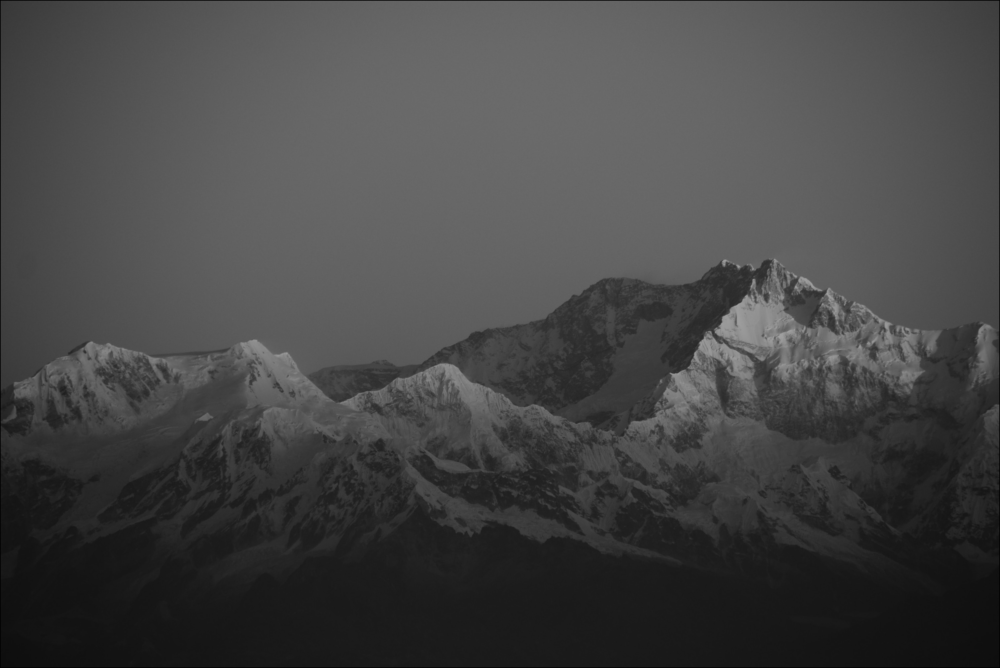

In [269]:
array = np.array(new_image, dtype=np.uint8)

Image.fromarray(array)

In [301]:
Gx = np.asarray([[-1, 0, 1],
                [-2, 0, 2],
                [-1, 0, 1]])

Gy = np.asarray([[1, 2, 1], 
                 [0, 0, 0],
                 [-1, -2, -1]])

In [302]:
intensity_gradient_x = signal.convolve(new_image, Gx)

In [303]:
Gy

array([[ 1,  2,  1],
       [ 0,  0,  0],
       [-1, -2, -1]])

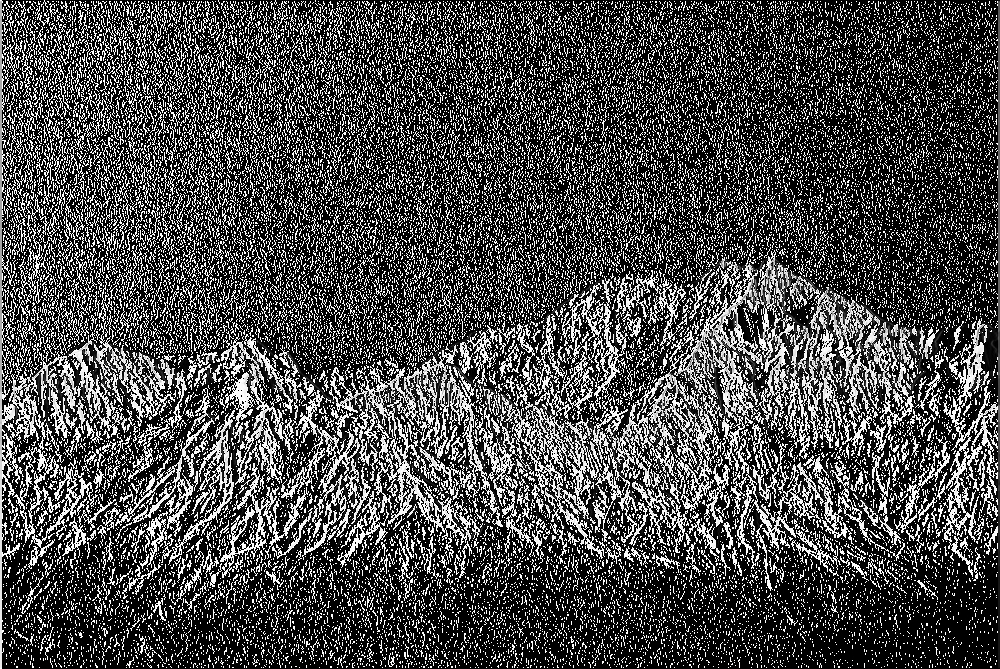

In [304]:
array = np.array(intensity_gradient_x, dtype=np.uint8)

Image.fromarray(array)

In [305]:
intensity_gradient_y  = signal.convolve(new_image, Gy)

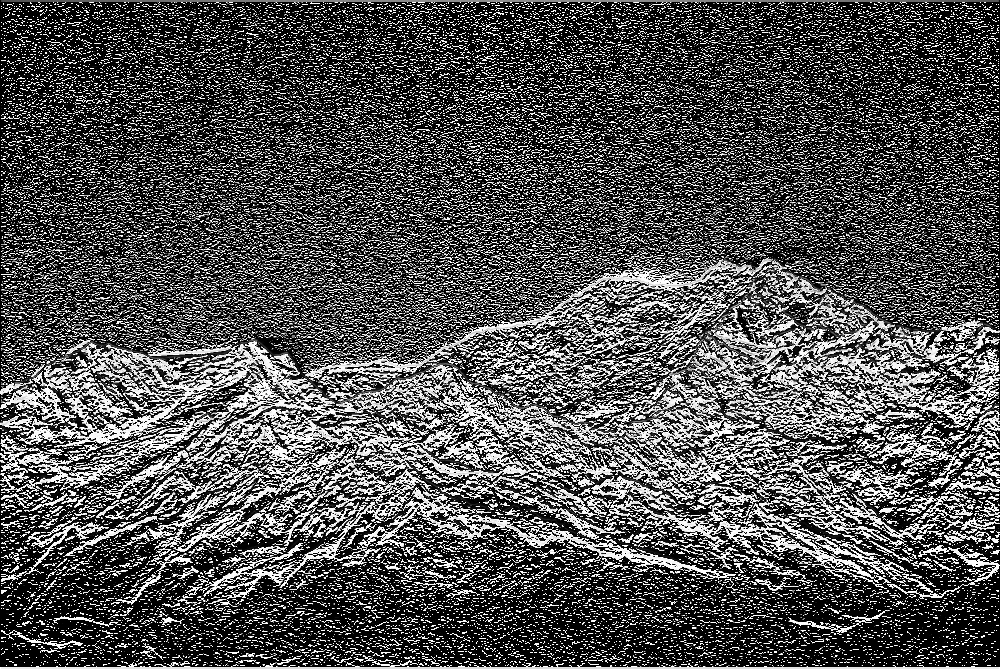

In [306]:
array = np.array(intensity_gradient_y, dtype=np.uint8)

Image.fromarray(array)

In [307]:
def magnitude(Gx, Gy):
    return np.hypot(Gx, Gy)

In [308]:
magnitude(intensity_gradient_x, intensity_gradient_y)

array([[ 0.96978876,  4.13948904,  9.67606239, ..., 10.7806154 ,
         4.5997861 ,  1.07422755],
       [ 4.13948904, 15.72959978, 33.43721717, ..., 37.14172316,
        17.42358223,  4.5707769 ],
       [ 9.67606239, 33.43721717, 63.144086  , ..., 69.94475077,
        36.93478661, 10.6555982 ],
       ...,
       [ 2.53066247,  8.74511834, 16.51460711, ..., 17.35078803,
         9.25953706,  2.67952497],
       [ 1.08263559,  4.11389533,  8.74511834, ...,  9.20294876,
         4.35588917,  1.14632004],
       [ 0.25363706,  1.08263559,  2.53066247, ...,  2.66596395,
         1.14632004,  0.26855689]])

In [309]:
magnitude_threshold = magnitude(intensity_gradient_x, intensity_gradient_y)

In [310]:
magnitude_threshold = magnitude_threshold / magnitude_threshold.max() * 255
theta = np.arctan2(intensity_gradient_y, intensity_gradient_x)

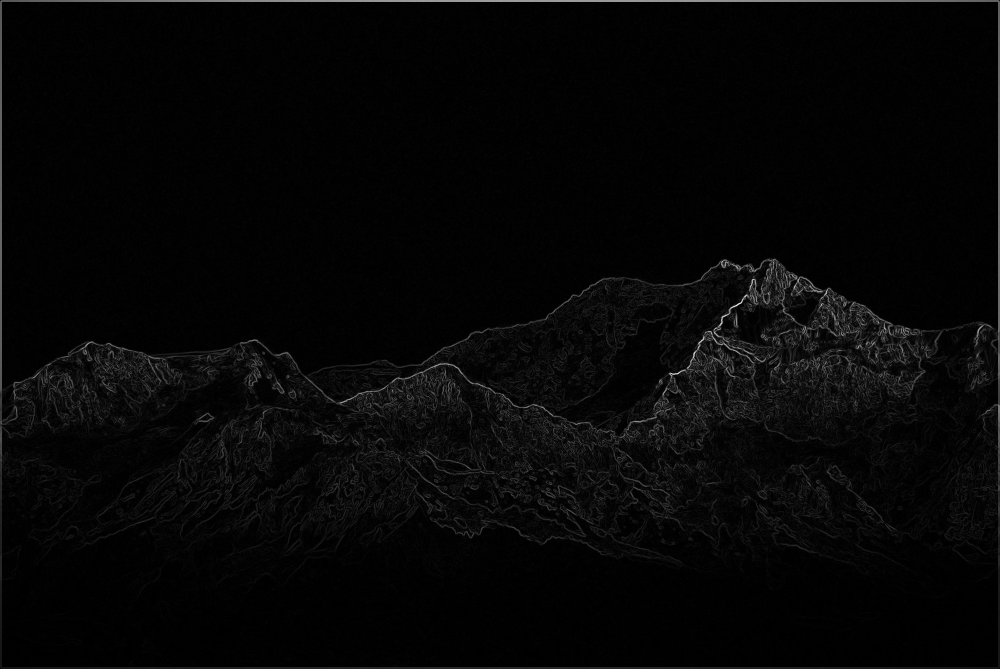

In [311]:
array = np.array(magnitude_threshold, dtype=np.uint8)

Image.fromarray(array)

In [312]:
h_k = magnitude_threshold.max()*0.09
l_k = magnitude_threshold.max()*0.09*0.05

In [313]:
high = np.where(magnitude_threshold >= magnitude_threshold.max()*0.09, 255, 0)
low = np.where(magnitude_threshold < l_k, 255, 0)


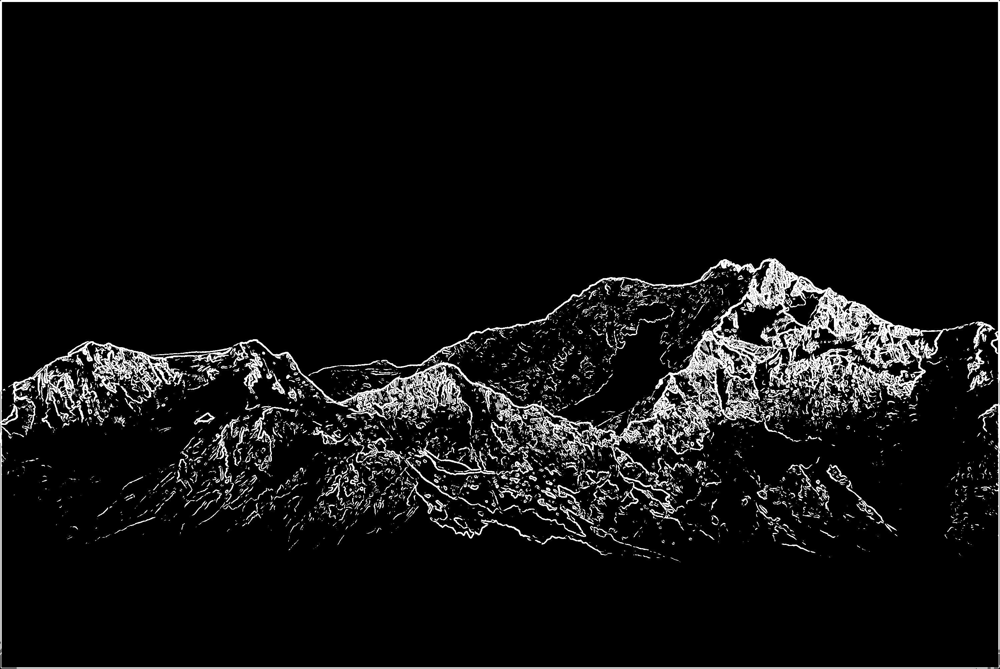

In [314]:
array = np.array(high, dtype=np.uint8)

im_b_f = Image.fromarray(array)
im_b_f

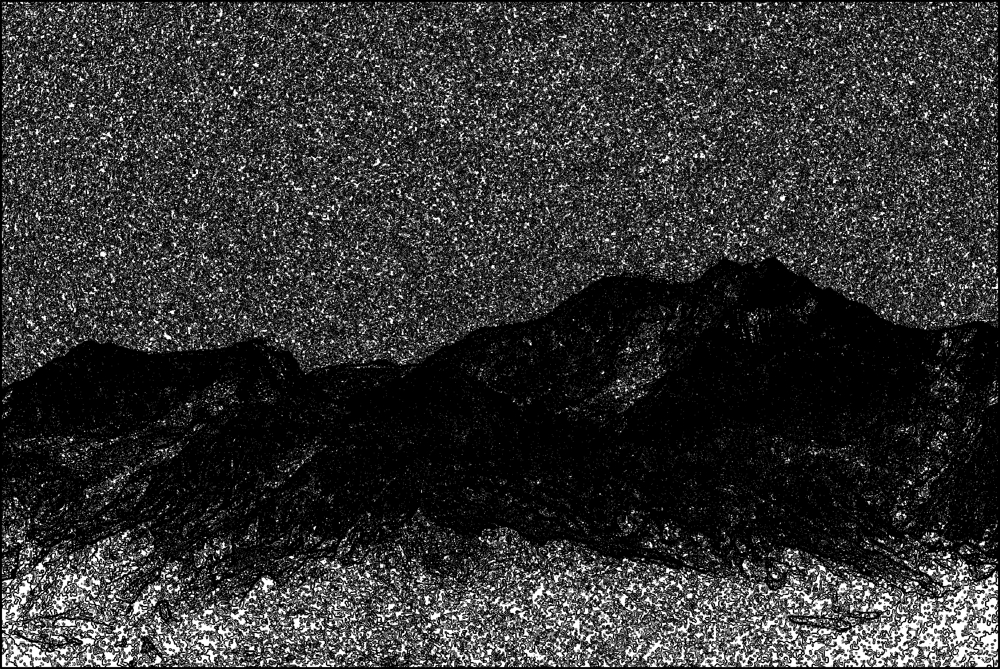

In [284]:
array = np.array(low, dtype=np.uint8)

im_b_f = Image.fromarray(array)
im_b_f

In [315]:

def hysteresis(image, weak=200):
    image_row, image_col = image.shape
 
    top_to_bottom = image.copy()
 

    for row in range(1, image_row):
        for col in range(1, image_col):
            if top_to_bottom[row, col] == weak:
                if top_to_bottom[row, col + 1] == 255 or top_to_bottom[row, col - 1] == 255 or top_to_bottom[row - 1, col] == 255 or top_to_bottom[
                    row + 1, col] == 255 or top_to_bottom[
                    row - 1, col - 1] == 255 or top_to_bottom[row + 1, col - 1] == 255 or top_to_bottom[row - 1, col + 1] == 255 or top_to_bottom[
                    row + 1, col + 1] == 255:
                    top_to_bottom[row, col] = 255
                else:
                    top_to_bottom[row, col] = 0
 
    bottom_to_top = image.copy()
 
    for row in range(image_row - 1, 0, -1):
        for col in range(image_col - 1, 0, -1):
            if bottom_to_top[row, col] == weak:
                if bottom_to_top[row, col + 1] == 255 or bottom_to_top[row, col - 1] == 255 or bottom_to_top[row - 1, col] == 255 or bottom_to_top[
                    row + 1, col] == 255 or bottom_to_top[
                    row - 1, col - 1] == 255 or bottom_to_top[row + 1, col - 1] == 255 or bottom_to_top[row - 1, col + 1] == 255 or bottom_to_top[
                    row + 1, col + 1] == 255:
                    bottom_to_top[row, col] = 255
                else:
                    bottom_to_top[row, col] = 0
 
    right_to_left = image.copy()
 
    for row in range(1, image_row):
        for col in range(image_col - 1, 0, -1):
            if right_to_left[row, col] == weak:
                if right_to_left[row, col + 1] == 255 or right_to_left[row, col - 1] == 255 or right_to_left[row - 1, col] == 255 or right_to_left[
                    row + 1, col] == 255 or right_to_left[
                    row - 1, col - 1] == 255 or right_to_left[row + 1, col - 1] == 255 or right_to_left[row - 1, col + 1] == 255 or right_to_left[
                    row + 1, col + 1] == 255:
                    right_to_left[row, col] = 255
                else:
                    right_to_left[row, col] = 0
 
    left_to_right = image.copy()
 
    for row in range(image_row - 1, 0, -1):
        for col in range(1, image_col):
            if left_to_right[row, col] == weak:
                if left_to_right[row, col + 1] == 255 or left_to_right[row, col - 1] == 255 or left_to_right[row - 1, col] == 255 or left_to_right[
                    row + 1, col] == 255 or left_to_right[
                    row - 1, col - 1] == 255 or left_to_right[row + 1, col - 1] == 255 or left_to_right[row - 1, col + 1] == 255 or left_to_right[
                    row + 1, col + 1] == 255:
                    left_to_right[row, col] = 255
                else:
                    left_to_right[row, col] = 0
 
    final_image = top_to_bottom + bottom_to_top + right_to_left + left_to_right
 
    final_image[final_image > 255] = 255
 
    return final_image

In [285]:
a= hysteresis(high)

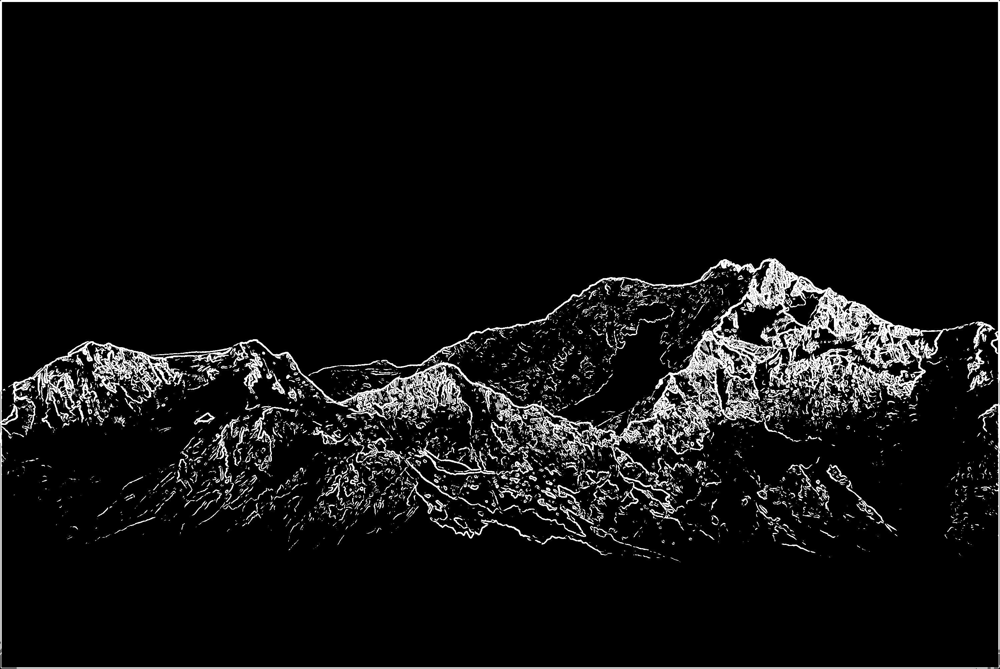

In [286]:
array = np.array(a, dtype=np.uint8)

Image.fromarray(array)